In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

# Objective

The objective of this project is to classify customer reviews as positive or negative and understand the pain points of customers who write negative reviews. By analyzing the sentiment of reviews, we aim to gain insights into product features that contribute to customer satisfaction or dissatisfaction.

## EDA

In [2]:
rev_badminton = pd.read_csv("reviews_badminton/data.csv")

In [3]:
rev_badminton.head()

,Reviewer Name,Review Title,Place of Review,Up Votes,Down Votes,Month,Review text,Ratings
0,Kamal Suresh,Nice product,"Certified Buyer, Chirakkal",889.0,64.0,Feb 2021,"Nice product, good quality, but price is now r...",4
1,Flipkart Customer,Don't waste your money,"Certified Buyer, Hyderabad",109.0,6.0,Feb 2021,They didn't supplied Yonex Mavis 350. Outside ...,1
2,A. S. Raja Srinivasan,Did not meet expectations,"Certified Buyer, Dharmapuri",42.0,3.0,Apr 2021,Worst product. Damaged shuttlecocks packed in ...,1
3,Suresh Narayanasamy,Fair,"Certified Buyer, Chennai",25.0,1.0,NaN,"Quite O. K. , but nowadays the quality of the...",3
4,ASHIK P A,Over priced,NaN,147.0,24.0,Apr 2016,Over pricedJust â?¹620 ..from retailer.I didn'...,1


In [4]:
rev_badminton.tail(10)

,Reviewer Name,Review Title,Place of Review,Up Votes,Down Votes,Month,Review text,Ratings
8508,NaN,NaN,NaN,NaN,NaN,NaN,No complaints about the item . Its the best on...,5
8509,NaN,NaN,NaN,NaN,NaN,NaN,Not sure why we have charged for this product ...,1
8510,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
8511,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
8512,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
8513,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
8514,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
8515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
8516,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
8517,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4


In [5]:
rev_badminton.shape

(8518, 8)

In [6]:
rev_badminton.columns

Index(['Reviewer Name', 'Review Title', 'Place of Review', 'Up Votes',
       'Down Votes', 'Month', 'Review text', 'Ratings'],
      dtype='object')

In [7]:
rev_badminton.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8518 entries, 0 to 8517
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Reviewer Name    8508 non-null   object 
 1   Review Title     8508 non-null   object 
 2   Place of Review  8468 non-null   object 
 3   Up Votes         8508 non-null   float64
 4   Down Votes       8508 non-null   float64
 5   Month            8053 non-null   object 
 6   Review text      8510 non-null   object 
 7   Ratings          8518 non-null   int64  
dtypes: float64(2), int64(1), object(5)
memory usage: 532.5+ KB


In [8]:
rev_badminton = rev_badminton.iloc[:-10]

In [9]:
rev_badminton["Ratings"].value_counts(normalize=True)

5    0.596850
4    0.204984
1    0.089915
3    0.072285
2    0.035966
Name: Ratings, dtype: float64

<Axes: >

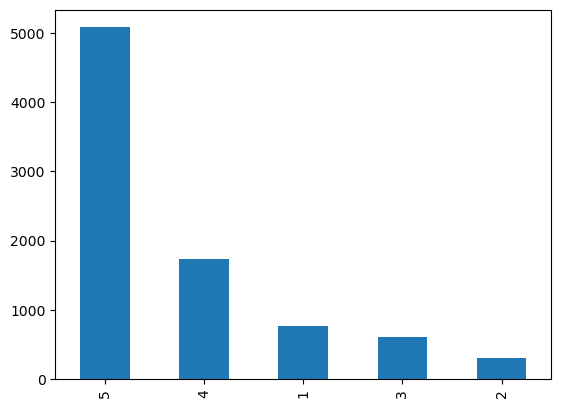

In [10]:
rev_badminton["Ratings"].value_counts().plot.bar()

In [11]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def display_wordcloud(data):
    wc = WordCloud(background_color='black',
               width=1600,
               height=800).generate(' '.join(data))
    plt.figure(1,figsize=(30,20))
    plt.imshow(wc)
    plt.axis('off')
    plt.show()

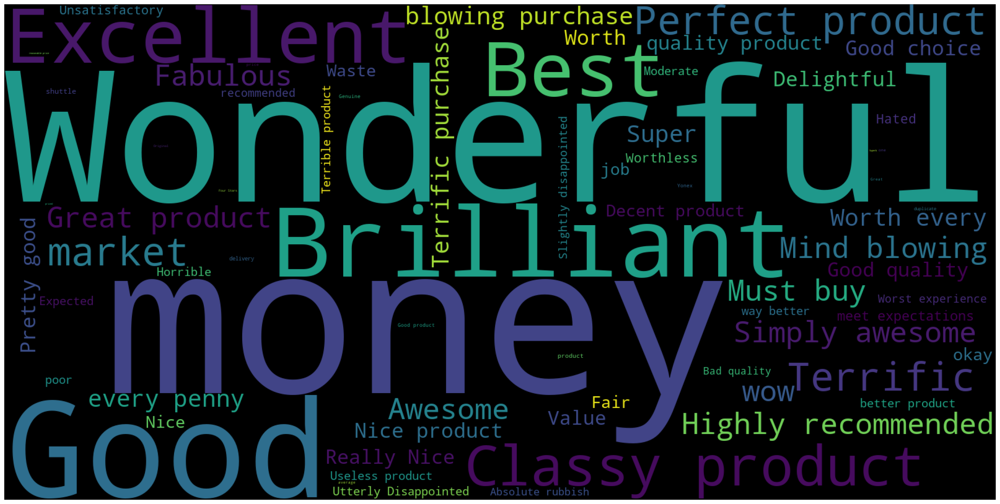

In [14]:
display_wordcloud(rev_badminton['Review Title'])

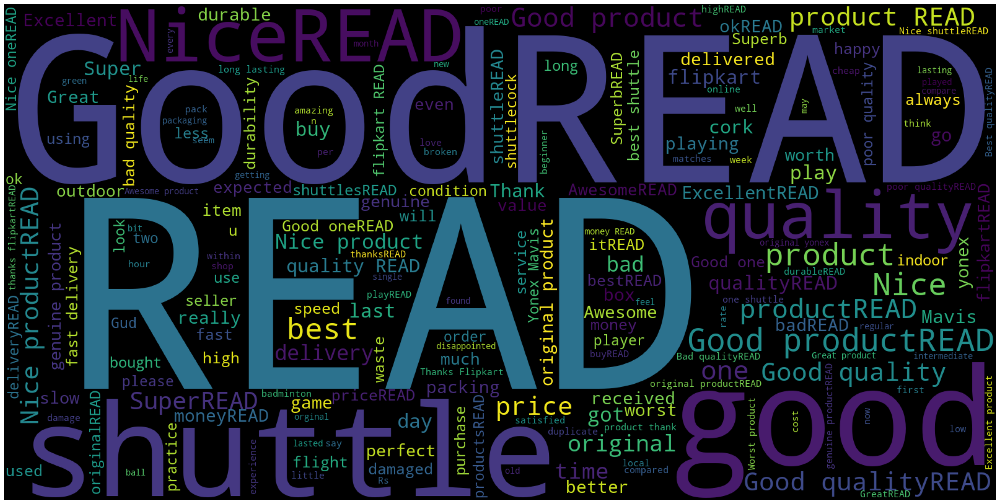

In [15]:
display_wordcloud(rev_badminton['Review text'])

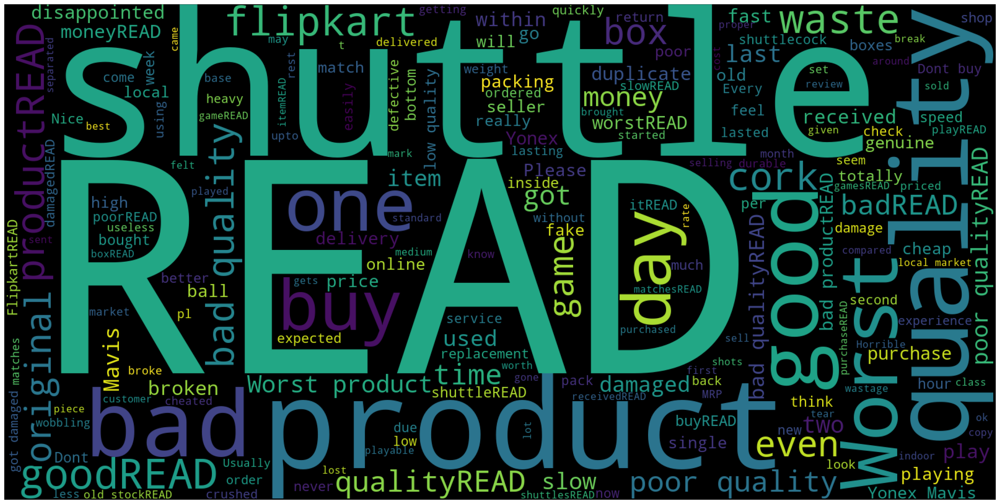

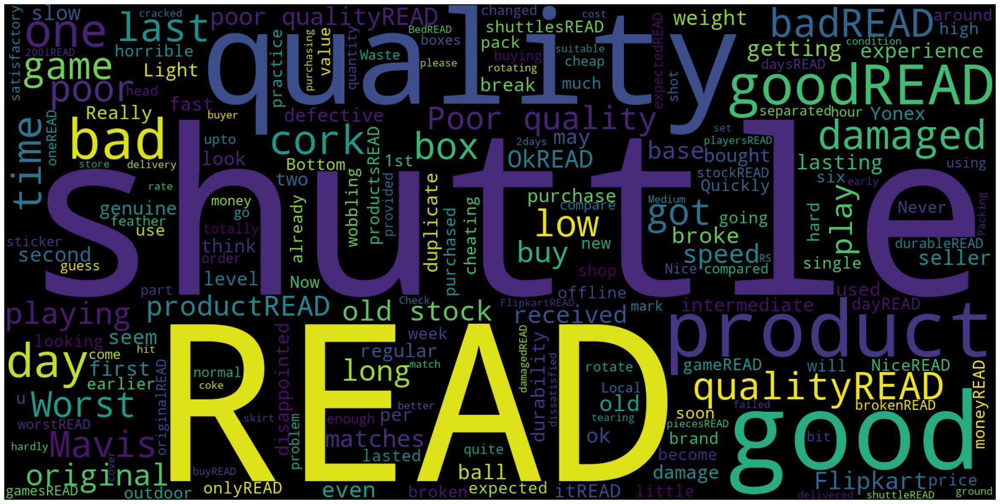

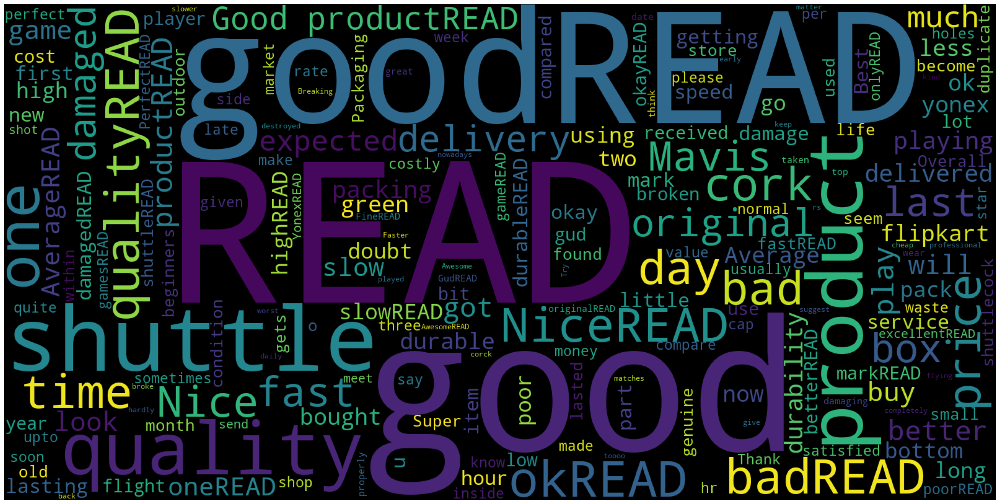

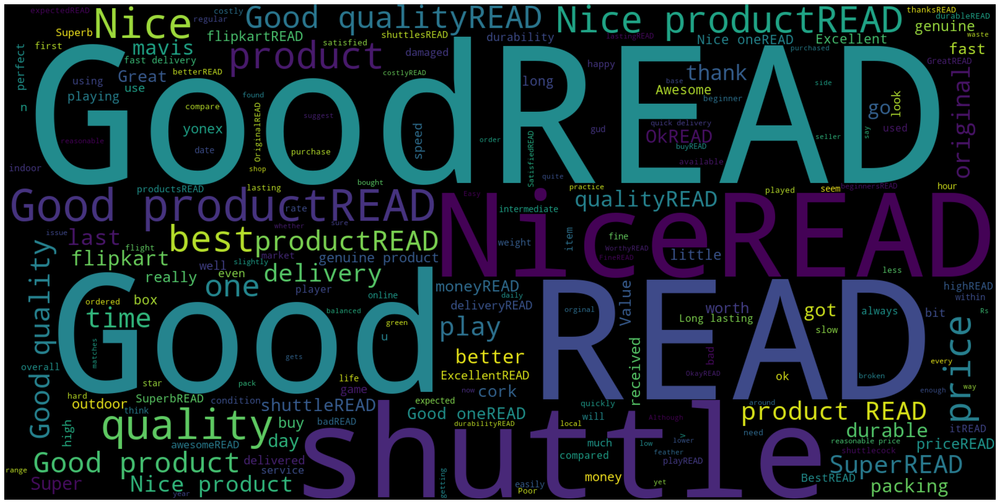

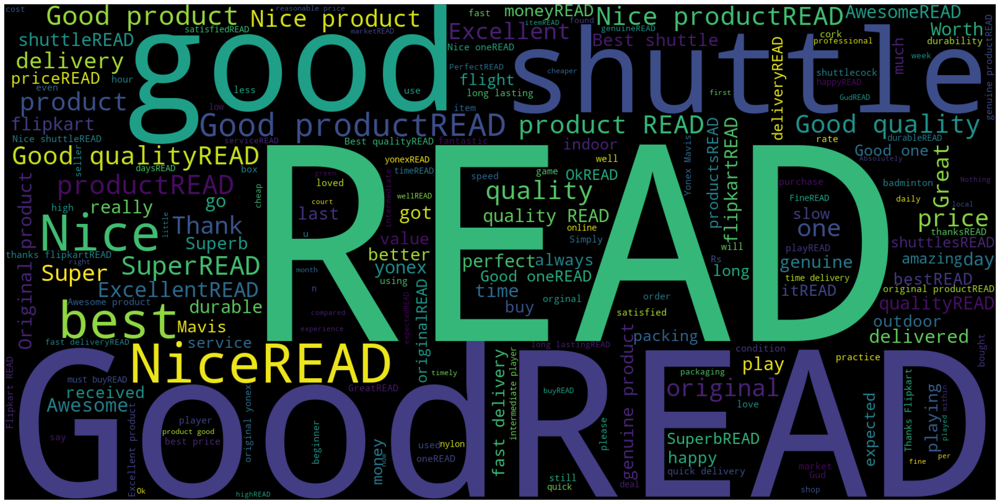

In [16]:
for i in range(1,6):
    display_wordcloud(rev_badminton["Review text"].loc[rev_badminton["Ratings"]==i])

# Data preprocessing

In [12]:
X_text =  rev_badminton[["Review Title","Review text"]]

In [13]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import re
import string

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

def clean_text(text):
    # Remove "READ MORE"
    text = re.sub(r'READ MORE', '', text)
    
    # Remove numbers
    text = re.sub(r'\d+', '', text)
    
    # Remove punctuation marks
    text = re.sub(f"[{string.punctuation}]", "", text)
    
    # Convert text to lowercase
    text = text.lower()
    
    # Tokenize the text into words
    tokens = word_tokenize(text)
    
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]
    
    # Lemmatize words to their base form
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    
    # Join tokens back into a single string
    cleaned_text = ' '.join(tokens)
    
    return cleaned_text

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DC\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\DC\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\DC\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [14]:
X_text["Clean_rev_title"] = X_text["Review Title"].apply(clean_text)

C:\Users\DC\AppData\Local\Temp\ipykernel_2184\2860199822.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_text["Clean_rev_title"] = X_text["Review Title"].apply(clean_text)


In [15]:
X_text["Clean_rev_text"] = X_text["Review text"].apply(clean_text)

C:\Users\DC\AppData\Local\Temp\ipykernel_2184\125293498.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_text["Clean_rev_text"] = X_text["Review text"].apply(clean_text)


In [16]:
X_text

,Review Title,Review text,Clean_rev_title,Clean_rev_text
0,Nice product,"Nice product, good quality, but price is now r...",nice product,nice product good quality price rising bad sig...
1,Don't waste your money,They didn't supplied Yonex Mavis 350. Outside ...,dont waste money,didnt supplied yonex mavis outside cover yonex...
2,Did not meet expectations,Worst product. Damaged shuttlecocks packed in ...,meet expectation,worst product damaged shuttlecock packed new b...
3,Fair,"Quite O. K. , but nowadays the quality of the...",fair,quite k nowadays quality cork like year back u...
4,Over priced,Over pricedJust â?¹620 ..from retailer.I didn'...,priced,pricedjust â¹ retaileri didnt understand wat a...
...,...,...,...,...
8503,Yones Mavis 350 Blue cap,Wrost and duplicate productDon't buy this sell...,yones mavis blue cap,wrost duplicate productdont buy seller product...
8504,For Mavis350,Received product intact and sealedREAD MORE,mavis,received product intact sealed
8505,Very Good,Delivered before time but price is high from m...,good,delivered time price high market
8506,Don't waste your money,up to the mark but same is available in market...,dont waste money,mark available market le price


In [17]:
from sklearn.feature_extraction.text import TfidfVectorizer
X_title_vectorizer = TfidfVectorizer()
X_text_vectorizer = TfidfVectorizer()
X_title_vectors = X_title_vectorizer.fit_transform(X_text["Clean_rev_title"])
X_text_vectors = X_text_vectorizer.fit_transform(X_text["Clean_rev_text"])
X_title_vectors_array = X_title_vectors.toarray()
X_text_vectors_array = X_text_vectors.toarray()
df_title = pd.DataFrame(X_title_vectors_array, columns=X_title_vectorizer.get_feature_names_out())
df_text = pd.DataFrame(X_text_vectors_array, columns=X_text_vectorizer.get_feature_names_out())

In [18]:
X_title_vectorizer.get_feature_names_out()

array(['aboveaverage', 'absolute', 'asangbam', 'authenticated', 'average',
       'awesome', 'bad', 'badminton', 'barcode', 'best', 'better', 'blue',
       'book', 'brand', 'brilliant', 'buy', 'buying', 'cancelled', 'cap',
       'cheating', 'choice', 'class', 'classy', 'compared', 'cost',
       'costly', 'could', 'counterfeit', 'daily', 'deal', 'decent',
       'delightful', 'delivery', 'disappointed', 'discount', 'dont',
       'door', 'duplicate', 'durable', 'ekart', 'even', 'ever', 'every',
       'excellent', 'expectation', 'expected', 'experience', 'fabulous',
       'fair', 'fast', 'faulty', 'finally', 'first', 'five', 'fk',
       'flipkart', 'four', 'game', 'genuine', 'genuinity', 'get', 'good',
       'great', 'happy', 'hated', 'hi', 'high', 'highly', 'horrible',
       'inflated', 'intermediate', 'job', 'lacking', 'lasting', 'late',
       'lightening', 'like', 'logistics', 'lol', 'long', 'low', 'lowest',
       'market', 'mavis', 'mechanism', 'meet', 'mindblowing', 'mixin

In [19]:
X_dtm = pd.concat([df_title,df_text], axis=1)

In [20]:
X_dtm["Ratings"] = rev_badminton["Ratings"]

In [21]:
X_dtm

,aboveaverage,absolute,asangbam,authenticated,average,awesome,bad,badminton,barcode,best,...,yonox,yoogot,you,youplz,youtube,yr,zero,â¹,𝙊𝙪𝙩𝙨𝙩𝙖𝙣𝙙𝙞𝙣𝙜,Ratings
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,4
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,3
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.320486,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8503,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1
8504,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,5
8505,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,3
8506,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,4


## Pipelines for Optimal Workflow

In [22]:
from sklearn.cluster import KMeans
k_means= KMeans(n_clusters=2,init = 'k-means++' ,random_state=0)
labels = k_means.fit_predict(X_dtm)

D:\Users\DC\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [23]:
X_dtm["cluster_id"] = labels

In [24]:
X_dtm["cluster_id"].value_counts()

1    6822
0    1686
Name: cluster_id, dtype: int64

<Axes: >

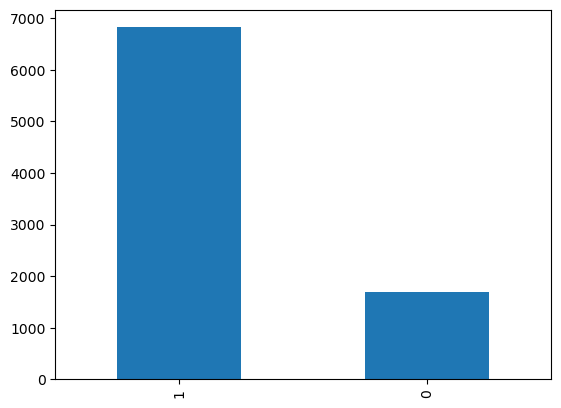

In [25]:
X_dtm["cluster_id"].value_counts().plot.bar()

In [26]:
final_df = rev_badminton[["Review Title","Review text"]]

In [27]:
final_df["cluster_id"] = X_dtm["cluster_id"]

C:\Users\DC\AppData\Local\Temp\ipykernel_2184\1290353623.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df["cluster_id"] = X_dtm["cluster_id"]


In [28]:
final_df

,Review Title,Review text,cluster_id
0,Nice product,"Nice product, good quality, but price is now r...",1
1,Don't waste your money,They didn't supplied Yonex Mavis 350. Outside ...,0
2,Did not meet expectations,Worst product. Damaged shuttlecocks packed in ...,0
3,Fair,"Quite O. K. , but nowadays the quality of the...",0
4,Over priced,Over pricedJust â?¹620 ..from retailer.I didn'...,0
...,...,...,...
8503,Yones Mavis 350 Blue cap,Wrost and duplicate productDon't buy this sell...,0
8504,For Mavis350,Received product intact and sealedREAD MORE,1
8505,Very Good,Delivered before time but price is high from m...,0
8506,Don't waste your money,up to the mark but same is available in market...,1


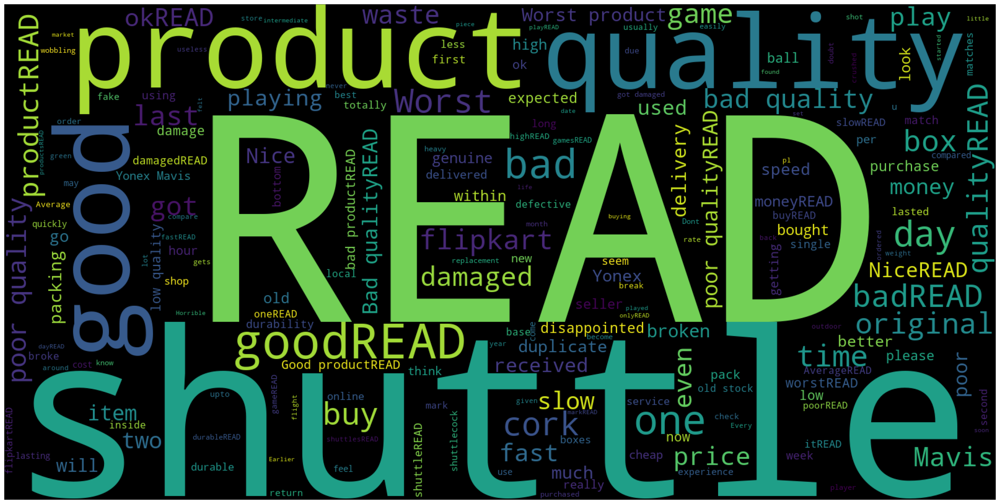

In [125]:
display_wordcloud(final_df["Review text"].loc[final_df["cluster_id"]==0])

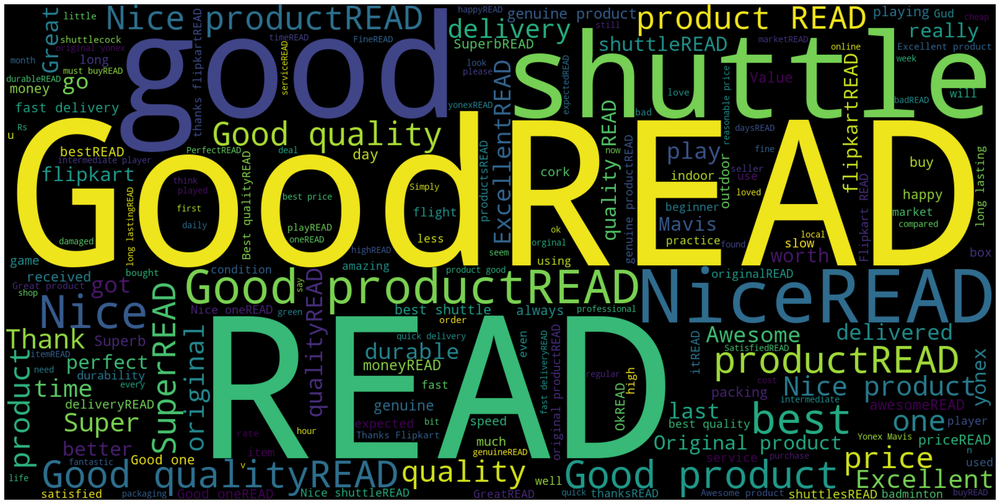

In [126]:
display_wordcloud(final_df["Review text"].loc[final_df["cluster_id"]==1])

In [127]:
final_df["cluster_id"]

0       1
1       0
2       0
3       0
4       0
       ..
8503    0
8504    1
8505    0
8506    1
8507    1
Name: cluster_id, Length: 8508, dtype: int32

In [29]:
X = final_df[["Review Title","Review text"]]
y = final_df["cluster_id"]

In [30]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=3)


In [31]:
from sklearn.pipeline import Pipeline

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
import joblib
from joblib import Memory
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score

import os

In [32]:
X_train

,Review Title,Review text
5748,Brilliant,Order got delivered within 24 hrs ...amazing d...
2952,Excellent,GoodREAD MORE
7270,Classy product,Good productREAD MORE
7124,Pretty good,best quality in low priseREAD MORE
5104,Terrific purchase,Poor qualityREAD MORE
...,...,...
7161,Worth every penny,goodqualityREAD MORE
2707,Delightful,UsefulREAD MORE
6400,Hated it!,very goodREAD MORE
1688,Highly recommended,Good qualityREAD MORE


In [33]:
%time X_title_clean = X_train["Review Title"].apply(lambda doc: clean_text(doc))

CPU times: total: 4 s
Wall time: 4.04 s


In [34]:
%time X_text_clean = X_train["Review text"].apply(lambda doc: clean_text(doc))

CPU times: total: 4.08 s
Wall time: 4.12 s


In [35]:
X_train_clean = pd.DataFrame(X_title_clean)

In [52]:
X_train_clean["Review text"] = X_text_clean

In [53]:
X_train_clean

,Review Title,Review text
5748,brilliant,order got delivered within hr amazing delivery...
2952,excellent,good
7270,classy product,good product
7124,pretty good,best quality low prise
5104,terrific purchase,poor quality
...,...,...
7161,worth every penny,goodquality
2707,delightful,useful
6400,hated,good
1688,highly recommended,good quality


In [36]:
%time X_test_clean = X_test["Review Title"].apply(lambda doc: clean_text(doc))

CPU times: total: 1.34 s
Wall time: 1.34 s


In [37]:
X_test_clean = pd.DataFrame(X_test_clean)

In [38]:
X_test_clean["Review text"]=X_test["Review text"].apply(lambda doc: clean_text(doc))

In [39]:
X_test_clean

,Review Title,Review text
8325,terrific purchase,thanks team timely delivery
434,brilliant,good product
3309,mindblowing purchase,original product
7906,nice,avarage
923,best market,tq
...,...,...
5339,perfect product,awesome product original durability
1571,wonderful,nice item
3227,perfect product,product quality mark
8399,nice product,good product proffesional player long lasting ...


In [40]:
import warnings

warnings.filterwarnings('ignore')

In [41]:
import mlflow

mlflow.set_experiment("Sentiment_analysis_prediction")

2024/03/26 16:05:24 INFO mlflow.tracking.fluent: Experiment with name 'Sentiment_analysis_prediction' does not exist. Creating a new experiment.


<Experiment: artifact_location='file:///C:/Users/DC/Documents/Innomatics_Internship/Sentiment_Analysis/mlruns/661272166221945022', creation_time=1711449324644, experiment_id='661272166221945022', last_update_time=1711449324644, lifecycle_stage='active', name='Sentiment_analysis_prediction', tags={}>

In [54]:
cachedir = '.cache'
memory = Memory(location=cachedir, verbose=0)

preprocessor = ColumnTransformer(
    transformers=[
        ('text_1', TfidfVectorizer(), 'Review Title'),  # TF-IDF vectorization for text_data_1
        ('text_2', TfidfVectorizer(), 'Review text'),  # TF-IDF vectorization for text_data_2    
    ])

pipelines = {
    'naive_bayes': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', MultinomialNB())
    ], memory=memory),
    'decision_tree': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', DecisionTreeClassifier())
    ], memory=memory),
    'logistic_regression': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', LogisticRegression())
    ], memory=memory)
}

# Define parameter grid for each algorithm
param_grids = {
    'naive_bayes': [
        {'classifier__alpha' : [1, 10]}
    ],
    'decision_tree': [
        {'classifier__max_depth': [None, 5, 10]}
    ],
    'logistic_regression': [
        {'classifier__C': [0.1, 1, 10], 
         'classifier__penalty': ['elasticnet'], 
         'classifier__l1_ratio': [0.4, 0.5, 0.6],
         'classifier__solver': ['saga'],
         'classifier__class_weight': ['balanced']
        }
    ]
}

# Perform GridSearchCV for each algorithm
best_models = {}

for algo in pipelines.keys():
    print("*"*10, algo, "*"*10)
    grid_search = GridSearchCV(estimator=pipelines[algo], 
                               param_grid=param_grids[algo], 
                               cv=5, 
                               scoring='f1', 
                               return_train_score=True,
                               verbose=1
                              )
    
    mlflow.sklearn.autolog(max_tuning_runs=None)
    
    with mlflow.start_run() as run:
        %time grid_search.fit(X_train_clean, y_train)
    
    best_models[algo] = grid_search.best_estimator_
    
    print('Score on Test Data: ', grid_search.score(X_test_clean, y_test))

2024/03/26 16:36:25 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'a2fddc03105e48a2b7c1c01baed2d8a5', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


********** naive_bayes **********
Fitting 5 folds for each of 2 candidates, totalling 10 fits


2024/03/26 16:37:55 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '480dd37eee044c4bbc2de0ace9083fb6', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


CPU times: total: 1min 8s
Wall time: 1min 30s
Score on Test Data:  0.9231190150478796
********** decision_tree **********
Fitting 5 folds for each of 3 candidates, totalling 15 fits


2024/03/26 16:39:22 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '5a9ec95f54e54f5aad1a93b6be563467', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


CPU times: total: 1min 15s
Wall time: 1min 27s
Score on Test Data:  0.9176144244105409
********** logistic_regression **********
Fitting 5 folds for each of 9 candidates, totalling 45 fits
CPU times: total: 2min 50s
Wall time: 3min 1s
Score on Test Data:  0.8986547085201794


In [143]:
for name, model in best_models.items():
    print(f"{name}")
    print(f"{model}")
    print()

naive_bayes
Pipeline(memory=Memory(location=.cache\joblib),
         steps=[('preprocessor',
                 ColumnTransformer(transformers=[('text_1', TfidfVectorizer(),
                                                  'Review Title'),
                                                 ('text_2', TfidfVectorizer(),
                                                  'Review text')])),
                ('classifier', MultinomialNB(alpha=1))])

decision_tree
Pipeline(memory=Memory(location=.cache\joblib),
         steps=[('preprocessor',
                 ColumnTransformer(transformers=[('text_1', TfidfVectorizer(),
                                                  'Review Title'),
                                                 ('text_2', TfidfVectorizer(),
                                                  'Review text')])),
                ('classifier', DecisionTreeClassifier(max_depth=10))])

logistic_regression
Pipeline(memory=Memory(location=.cache\joblib),
         steps=[('preproce

In [144]:
for name, model in best_models.items():
    print("*"*10, name, "*"*10)
    
    joblib.dump(model, f'best_models/{name}.pkl')
    model = joblib.load(f'best_models/{name}.pkl')
    
    %time y_test_pred = model.predict(X_test_clean)
    print("Test Score (F1)", metrics.f1_score(y_test, y_test_pred.reshape(-1,1)))
    
    print("Model Size:", os.path.getsize(f'best_models/{name}.pkl'), "Bytes")

********** naive_bayes **********
CPU times: total: 31.2 ms
Wall time: 34.2 ms
Test Score (F1) 0.9231190150478796
Model Size: 165119 Bytes
********** decision_tree **********
CPU times: total: 31.2 ms
Wall time: 30.4 ms
Test Score (F1) 0.9176144244105409
Model Size: 91297 Bytes
********** logistic_regression **********
CPU times: total: 31.2 ms
Wall time: 36.1 ms
Test Score (F1) 0.8986547085201794
Model Size: 101431 Bytes


In [145]:
model = joblib.load(f'best_models/decision_tree.pkl')

In [146]:
model

Pipeline(memory=Memory(location=.cache\joblib),
         steps=[('preprocessor',
                 ColumnTransformer(transformers=[('text_1', TfidfVectorizer(),
                                                  'Review Title'),
                                                 ('text_2', TfidfVectorizer(),
                                                  'Review text')])),
                ('classifier', DecisionTreeClassifier(max_depth=10))])

In [147]:
y_proba = model.predict_proba(X_test_clean)
y_proba

array([[0.11367638, 0.88632362],
       [0.11367638, 0.88632362],
       [0.11367638, 0.88632362],
       ...,
       [0.11367638, 0.88632362],
       [0.66666667, 0.33333333],
       [0.11367638, 0.88632362]])

In [165]:
data_point = ["bad product","bad quality product, not satisfied"]

In [166]:
data_dict = {}
data_dict["Review Title"]=clean_text(data_point[0])
data_dict["Review text"]=clean_text(data_point[1])    

In [167]:
data_df = pd.DataFrame(data_dict, index=[0])
data_df

,Review Title,Review text
0,bad product,bad quality product satisfied


In [168]:
sentiment = int(model.predict(data_df))

In [169]:
sentiment

0

In [159]:
model

Pipeline(memory=Memory(location=.cache\joblib),
         steps=[('preprocessor',
                 ColumnTransformer(transformers=[('text_1', TfidfVectorizer(),
                                                  'Review Title'),
                                                 ('text_2', TfidfVectorizer(),
                                                  'Review text')])),
                ('classifier', DecisionTreeClassifier(max_depth=10))])

In [42]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB

from sklearn.model_selection import GridSearchCV

from sklearn.pipeline import Pipeline

In [60]:
cachedir = '.cache'
memory = Memory(location=cachedir, verbose=0)

preprocessor = ColumnTransformer(
    transformers=[
        ('text_1', TfidfVectorizer(), 'Review Title'),  # TF-IDF vectorization for text_data_1
        ('text_2', TfidfVectorizer(), 'Review text'),  # TF-IDF vectorization for text_data_2    
    ])

pipelines = {
    'knn' : Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', KNeighborsClassifier())
    ]), 
    'svc' : Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', SVC())
    ]),
    'logistic_regression': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', LogisticRegression())
    ]),
    'random_forest': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', RandomForestClassifier())
    ]),
    'decision_tree': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', DecisionTreeClassifier())
    ]),
    'naive_bayes': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', MultinomialNB())
    ], memory=memory)
}

# Define parameter grid for each algorithm
param_grids = {
    'knn': [
        {
            'classifier__n_neighbors' : [i for i in range(3, 21, 2)], 
            'classifier__p' : [1, 2, 3]
        }
    ],
    'svc': [
        {
            'classifier__kernel' : ['rbf'], 
            'classifier__C' : [0.1, 0.01, 1, 10, 100]
        }, 
        {
            'classifier__kernel' : ['poly'], 
            'classifier__degree' : [2, 3, 4, 5], 
            'classifier__C' : [0.1, 0.01, 1, 10, 100]
        }, 
        {
            'classifier__kernel' : ['linear'], 
            'classifier__C' : [0.1, 0.01, 1, 10, 100]
        }
    ],
    'logistic_regression': [
        {
            
            'classifier__C': [0.1, 1, 10], 
            'classifier__penalty': ['l2']
        }, 
        {
            'classifier__C': [0.1, 1, 10], 
            'classifier__penalty': ['l1'], 
            'classifier__solver': ['liblinear']
        }, 
        {
            'classifier__C': [0.1, 1, 10], 
            'classifier__penalty': ['elasticnet'], 
            'classifier__l1_ratio': [0.4, 0.5, 0.6],
            'classifier__solver': ['saga']
        }
    ],
    'random_forest': [
        {
            'classifier__n_estimators': [50, 100, 200]
        }
    ],
    'decision_tree': [
        {
            'classifier__max_depth': [None, 5, 10]
        }
    ],
    'naive_bayes': [
        {'classifier__alpha' : [1, 10]}
    ]
    
}

In [58]:
best_models = {}

# Run the Pipeline
for algo in pipelines.keys():
    print("*"*10, algo, "*"*10)
    grid_search = GridSearchCV(estimator=pipelines[algo], 
                               param_grid=param_grids[algo], 
                               cv=5, 
                               scoring='accuracy', 
                               return_train_score=True,
                               verbose=1
                              )
    
    mlflow.sklearn.autolog(max_tuning_runs=None)
    
    with mlflow.start_run() as run:
        
        %time grid_search.fit(X_train_clean, y_train)
        
    print('Train Score: ', grid_search.best_score_)
    print('Test Score: ', grid_search.score(X_test_clean, y_test))
    
    best_models[algo] = grid_search.best_estimator_
    print()

********** knn **********
Fitting 5 folds for each of 27 candidates, totalling 135 fits
CPU times: total: 7min 27s
Wall time: 4min 49s
Train Score:  0.8247918932254524
Test Score:  0.8359191349318289

********** svc **********
Fitting 5 folds for each of 30 candidates, totalling 150 fits
CPU times: total: 10min 59s
Wall time: 11min 12s
Train Score:  0.8716487506229088
Test Score:  0.8871650211565585

********** logistic_regression **********
Fitting 5 folds for each of 15 candidates, totalling 75 fits
CPU times: total: 2min 51s
Wall time: 3min 4s
Train Score:  0.8732162714826824
Test Score:  0.8895157498824635

********** random_forest **********
Fitting 5 folds for each of 3 candidates, totalling 15 fits
CPU times: total: 7min 6s
Wall time: 7min 28s
Train Score:  0.8663222973122251
Test Score:  0.8787023977433004

********** decision_tree **********
Fitting 5 folds for each of 3 candidates, totalling 15 fits
CPU times: total: 1min 18s
Wall time: 1min 28s
Train Score:  0.85566472654610

ValueError: Invalid parameter 'alpha' for estimator GaussianNB(). Valid parameters are: ['priors', 'var_smoothing'].

AttributeError: 'GridSearchCV' object has no attribute 'best_score_'

In [69]:
cachedir = '.cache'
memory = Memory(location=cachedir, verbose=0)

preprocessor = ColumnTransformer(
    transformers=[
        ('text_1', TfidfVectorizer(), 'Review Title'),  # TF-IDF vectorization for text_data_1
        ('text_2', TfidfVectorizer(), 'Review text'),  # TF-IDF vectorization for text_data_2    
    ])

pipe_1 = Pipeline(
    [
        ('preprocessor', preprocessor),
        ('classifier', DecisionTreeClassifier())
    ], memory=memory)



# Observe the Key Value Pair format
parameter_grid_1 = [
        {
            'classifier__max_depth': [None, 5, 10]
        }
    ]

In [71]:
clf = GridSearchCV(
    estimator=pipe_1, 
    param_grid=parameter_grid_1, 
    scoring='accuracy',
    cv=5,
    return_train_score=True,
    verbose=1
)

# Initialize the auto logger
# max_tuning_runs=None will make sure that all the runs are recorded.
# By default top 5 runs will be recorded for each experiment
mlflow.sklearn.autolog(max_tuning_runs=None)

with mlflow.start_run() as run:
    mlflow.set_tag("stage", "Production")
    %time clf.fit(X_train_clean, y_train)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
CPU times: total: 1min 18s
Wall time: 1min 33s
